In [2]:
import io
from functools import reduce
import requests
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.cm
from scipy.ndimage import zoom
from scipy.interpolate import griddata
from PIL import Image
import cv2
from tqdm import tqdm
from matplotlib.cm import ScalarMappable
from matplotlib.colors import Normalize
import seaborn as sns
import matplotlib.colors as mcolors
import pickle

In [3]:
#download the summer dataframes for the timespan from 2009 - 2019 for all local (earth) time zones
#the download files consist of 96 dataframes each covering the daily measurements of a 15min interval

lunar_temp_data_collection = []

for i in tqdm(range(1, 5), desc='Downloading data'):

    url = f'https://pds-geosciences.wustl.edu/lro/urn-nasa-pds-lro_diviner_derived1/data_derived_pcp/diurnal/ltim/poln/pcp_avg_tbol_poln_sum_ltim{i:02d}_240.tab'

    # Load the data frame from the URL using requests
    response = requests.get(url, verify=True)

    response.raise_for_status()  # raise an exception if there was an error


    # Load the data frame from the response content
    current_df = pd.read_csv(io.StringIO(response.content.decode()))

    #delete unneccesary rows of current_df to optimize storage requirements
    current_df.drop(['        x', '         y'], axis=1, inplace=True)
    current_df[['        clon', '       clat', '       tbol']] = current_df[['        clon', '       clat', '       tbol']].astype(np.float32)


    current_df_memory_usage = current_df.memory_usage().sum()
    print(f"Memory usage of {i}th dataframe: {current_df_memory_usage / 1024 / 1024:.2f} MB")

    lunar_temp_data_collection.append(current_df)

Memory usage of 1th dataframe: 50.86 MB


Memory usage of 2th dataframe: 52.08 MB


Memory usage of 3th dataframe: 48.68 MB


Memory usage of 4th dataframe: 50.35 MB


In [4]:
#safe lunar_temp_data_collection to a file

with open('../results/lunar_temp_data_collection', 'wb') as file:
    pickle.dump(lunar_temp_data_collection, file)


In [5]:
#open lunar_temp_data_collection

with open('../results/lunar_temp_data_collection', 'rb') as file:
    lunar_temp_data_collection = pickle.load(file)

## Across All Local Time Intervals

In [6]:
#set constraint ranges in Kelvin
temp_min = 243
temp_max = 303
temp_avg = 283

#set parameters for analysis & visualization
coordinate_decimals = 3
heat_map_bins = 2000

#### Analysis

In [7]:
#Perform groupby across all local times
#group measurements by unique combinations of longitutde and latitude and calculate min, max and avg for every position

#append all dataframes for all local times
lunar_temp_data_total = pd.concat(lunar_temp_data_collection)

#round coordinates of measurements to derive representetive data for specific regions 
lunar_temp_data_total['        clon'] = lunar_temp_data_total['        clon'].round(decimals = coordinate_decimals)
lunar_temp_data_total['       clat'] = lunar_temp_data_total['       clat'].round(decimals = coordinate_decimals)

# Select 30% of the data randomly to reduce data complexity
sample_fraction = 0.3
lunar_temp_sample = lunar_temp_data_total.sample(frac=sample_fraction)


#perfom groupby to determine min, max and avergage temperature brightness values 
lunar_temp_data_analysed = lunar_temp_data_total.groupby(['        clon', '       clat']).agg({'       tbol': ['min', 'max', 'mean']}).reset_index()
lunar_temp_data_analysed

clon        clat        tbol                      
                                         min        max       mean
0        -179.955002   80.003998   64.016754  64.557220  64.339188
1        -179.955002   80.012001   63.344925  64.270378  63.765976
2        -179.955002   80.019997   62.069565  64.530731  63.098206
3        -179.955002   80.027000   61.328682  64.960907  62.631592
4        -179.955002   80.035004   60.936012  64.132973  62.043217
...              ...         ...         ...        ...        ...
5039885   180.000000   89.959999   61.124615  61.842041  61.497738
5039886   180.000000   89.968002   60.993702  63.557995  62.328537
5039887   180.000000   89.975998   62.566208  66.952858  64.698868
5039888   180.000000   89.984001   65.637970  70.461365  67.042007
5039889   180.000000   89.991997   78.723778  82.797653  80.646324

[5039890 rows x 5 columns]

In [8]:
#Calculate feasibility score
lunar_temp_data_analysed['feasibility_score'] = ((temp_min - lunar_temp_data_analysed['       tbol',  'min'])** 2) * 1/3 + ((temp_max - lunar_temp_data_analysed['       tbol',  'max']) ** 2) * 1/3 + ((temp_avg - lunar_temp_data_analysed['       tbol',  'mean']) ** 2) * 1/3
lunar_temp_data_analysed

clon        clat        tbol                         
                                         min        max       mean   
0        -179.955002   80.003998   64.016754  64.557220  64.339188  \
1        -179.955002   80.012001   63.344925  64.270378  63.765976   
2        -179.955002   80.019997   62.069565  64.530731  63.098206   
3        -179.955002   80.027000   61.328682  64.960907  62.631592   
4        -179.955002   80.035004   60.936012  64.132973  62.043217   
...              ...         ...         ...        ...        ...   
5039885   180.000000   89.959999   61.124615  61.842041  61.497738   
5039886   180.000000   89.968002   60.993702  63.557995  62.328537   
5039887   180.000000   89.975998   62.566208  66.952858  64.698868   
5039888   180.000000   89.984001   65.637970  70.461365  67.042007   
5039889   180.000000   89.991997   78.723778  82.797653  80.646324   

        feasibility_score  
                           
0            45567.503906  
1            45777.109375  
2            45986.738281  
3            46076.437500  
4            46342.222656  
...                   ...  
5039885      46766.355469  
5039886      46384.886719  
5039887      45310.000000  
5039888      44056.457031  
5039889      38807.585938  

[5039890 rows x 6 columns]

### Visualization: Temperature Map

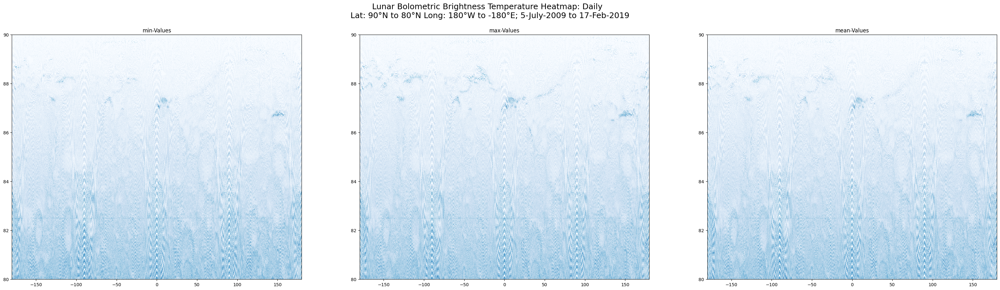

<Figure size 640x480 with 0 Axes>

In [9]:
# Heat Map Visualization

fig, axs = plt.subplots(1, 3, figsize=(40, 10))

X = lunar_temp_data_analysed['        clon']
Y = lunar_temp_data_analysed['       clat']

for iteration, operation in enumerate(['min', 'max', 'mean']):
    
    w = lunar_temp_data_analysed['       tbol',  operation]

    axs[iteration].hist2d(X, Y, bins=heat_map_bins, cmap='Blues', weights=w)
    axs[iteration].set_title(f'{operation}-Values')

#plt.colorbar()
fig.suptitle(f'Lunar Bolometric Brightness Temperature Heatmap: Daily \n Lat: 90°N to 80°N Long: 180°W to -180°E; 5-July-2009 to 17-Feb-2019', fontsize=18, ha='center')
            
plt.show()
plt.savefig('../results/Lunar_tbol_Heatmap_t=daily.png')

In [10]:
#data compression -> reducing computiational complexity

lunar_temp_data_analysed.to_hdf('../data/lunar_temp_data_analysed_compressed', key='data', mode='w', complevel=9, complib='blosc')
lunar_temp_data_analysed = pd.read_hdf('../data/lunar_temp_data_analysed_compressed', key='data')

In [11]:
#Create Visualization with topographic map of the moon surface

fig, axs = plt.subplots(1, 3, figsize=(80, 20))

# Read the lunar topography image using Pillow
lunar_north_pole_img_original = Image.open('../data/6304h.tiff')

#convert lunar image into numpy array and get it into the right color format for further processing the image with libaries such as OpenCV
lunar_img_np = np.array(lunar_north_pole_img_original)
lunar_north_pole_img = cv2.cvtColor(lunar_img_np, cv2.COLOR_RGB2BGR)

#convert lunar north pole image into greyscale format to have a baseline map for choropleth map
lunar_north_pole_img_grey = cv2.cvtColor(lunar_north_pole_img, cv2.COLOR_RGB2GRAY)

#splitting the lunar_north_pole_image binarily into tha part with the black background and the coloured part
#all pixel colour values under 1 (-> near black values) get the value 0, the others get the value 255
#based on the number assignements all pixels with the value 255 are selected to create a mask, which is the part of the picture containing the satellite map, excluding the near-black background
#_ stores the threshold value and is not required anymore
#mask stores the relevant pixel positions 
_, mask = cv2.threshold(lunar_north_pole_img_grey, 1, 255, cv2.THRESH_BINARY)

#Find the center and radius of the North Pole region
#1. Get identified contours of the picture (outer lines of identied forms)
contours, _ = cv2.findContours(mask, 
                               cv2.RETR_EXTERNAL, #Taking only the extreme outer contours, because contour hierarchies are not relevant in this case
                               cv2.CHAIN_APPROX_SIMPLE #Removes redundant point and compreses data complexity
                               )

#2. Determine the maximum area enclosed by the contour using the max-function
contour_area = max( #determines the maximum elememnt in an iterable 
                   contours, #iterable = list of contours
                   key=cv2.contourArea #key to choose largest elements: cv2.contourArea which determines the area size enclosed by a contour
                   )

#3. Determine the minimum circle that encloses the contour_area and get center + radius
(x, y), radius = cv2.minEnclosingCircle(contour_area)

#performing the choropleth map creation for every operation (min, max, avg)
for iteration, operation in enumerate(['min', 'max', 'mean']):

    lunar_temp_data_analysed_iteration = lunar_temp_data_analysed[[('        clon',     ''),( '       clat',     ''),( '       tbol', operation)]].copy()

    #Normalization: The data must be normalized on a scale of 0-1 so that it can later be used to create a colormap
    #1. Normalization Approach: min-max-normalization
    #normalized_temps = (lunar_temp_data_analysed_iteration['       tbol',  operation] - np.min(lunar_temp_data_analysed_iteration['       tbol',  operation])) / (np.max(lunar_temp_data_analysed_iteration['       tbol',  operation]) - np.min(lunar_temp_data_analysed_iteration['       tbol',  operation]))

    #2. Normalization Approach: percentile normalization (Better choice because more resistent to outliers)
    p1 = np.percentile(lunar_temp_data_analysed_iteration['       tbol',  operation], 1)
    p99 = np.percentile(lunar_temp_data_analysed_iteration['       tbol',  operation], 99)
    normalized_temps = (lunar_temp_data_analysed_iteration['       tbol',  operation] - p1) / (p99 - p1)

    lunar_temp_data_analysed_iteration['       tbol', operation] = normalized_temps.copy()    

    #Bring data into a coordinate-grid
    temperature_grid = lunar_temp_data_analysed_iteration.pivot(index='       clat', columns='        clon', values=('       tbol', operation))
    temperature_grid = temperature_grid.fillna(normalized_temps.mean()).copy()

    #Polar coordinates (clats, clons) of the temperature data
    clats, clons = np.mgrid[80:90:(temperature_grid.shape[0] * 1j), -180:180:(temperature_grid.shape[1] * 1j)]

    #Convert the polar coordinates to Cartesian coordinates 
    radius_scaled = radius * (clats - 80) / 10 #calculated the scaled_radius by dividing the actual clat delta by the max clat delta
    cart_x = radius_scaled * np.cos(np.radians(clons)) + x #radians(clons) converts degrees to radians, by multyplining the radius_scaled by the cos of that radiant the x values can be determined 
                                                           #Imagine triangles in Cartesian coordinate system (one edge along the x-axis, one between the center and the pixel,...)
                                                           #The + x helps to set the centre to the centre of the lunar image 
    cart_y = radius_scaled * np.sin(np.radians(clons)) + y # "

    coords = np.array([cart_x.ravel(), cart_y.ravel()]).T #coordinates are each flattend into 1D arrays, mapped by their index and transposed to get in the right format

    #Data Interpolation to create a dataframe of the same size as the lunar image that contains the brightness values
    temperature_data_mapped = griddata( #griddata performs interpolation - estimating a value based on a set of known data points to, in this case, reduce the amount of data points
                                        coords, #coordinates of input data points
                                        temperature_grid.to_numpy().ravel(), #values of input data points
                                        (np.indices(lunar_north_pole_img.shape[:2])[1], np.indices(lunar_north_pole_img.shape[:2])[0]), #coordinates of the points where to interpolate -> using the pixels of the lunar image (:2, because cholor channels in 3rd index are not to be considered)
                                        method='cubic' #as a more complex interpolation method (alt: linear, nearest)
                                        )
    
    #Potential C-Maps
    colors = ['PiYG', 'PRGn', 'BrBG', 'PuOr', 'RdGy', 'RdBu', 'RdYlBu', 'RdYlGn', 'Spectral', 'coolwarm', 'bwr', 'seismic',
            'viridis', 'plasma', 'inferno', 'magma', 'cividis',
            'Greys', 'Purples', 'Blues', 'Greens', 'Oranges', 'Reds', 'YlOrBr', 'YlOrRd', 'OrRd', 'PuRd', 'RdPu', 'BuPu', 'GnBu', 'PuBu', 'YlGnBu', 'PuBuGn', 'BuGn', 'YlGn',
            'binary', 'gist_yarg', 'gist_gray', 'gray', 'bone', 'pink', 'spring', 'summer', 'autumn', 'winter', 'cool', 'Wistia', 'hot', 'afmhot', 'gist_heat', 'copper',
            'twilight', 'twilight_shifted', 'hsv',
            'flag', 'prism', 'ocean', 'gist_earth', 'terrain', 'gist_stern', 'gnuplot', 'gnuplot2', 'CMRmap', 'cubehelix', 'brg', 'gist_rainbow', 'rainbow', 'jet', 'turbo', 'nipy_spectral', 'gist_ncar']

    #Color the North Pole region based on the mapped temperature data
    for color in colors:
        color = 'rainbow'
        colormap = plt.get_cmap(f'{color}') #{color}')
        #colormap = sns.color_palette("viridis", as_cmap=True)
        #colormap = sns.color_palette("Spectral", as_cmap=True)
        #colormap = sns.color_palette("coolwarm", as_cmap=True)
        #colormap = sns.cubehelix_palette(start=0, rot=2, dark=0, light=1, as_cmap=True)

        colored_temps = colormap(temperature_data_mapped)

        #Apply the mask to only color the region of interest
        colored_roi = (colored_temps[:, :, :3] * 255 * (mask[:, :, np.newaxis] / 255)).astype(np.uint8) #the mask-normalization serves the purpose of turning the mask values (0&255) into 0 & 1s -> Multiplying this with the colored_temps "delets" all colors out of the region of interest
        colored_image = cv2.addWeighted(lunar_north_pole_img, 0.4, colored_roi, 0.6, 0) #laying the lunar image and the colors of the region of interests on top of each other 

        #Save the final image
        final_image = cv2.cvtColor(colored_image, cv2.COLOR_BGR2RGB)
        current_image = Image.fromarray(final_image)
        current_image.save(f'../results/Lunar_tbol_Choropleth_c={color}_op={operation}_t=daily.tiff')

    axs[iteration].imshow(current_image)
    axs[iteration].set_title(f'{operation}-Values')
    
p1 = np.percentile(lunar_temp_data_analysed['       tbol',  'mean'], 1)
p99 = np.percentile(lunar_temp_data_analysed['       tbol',  'mean'], 99)

#Create the Normalize object using the min and max percentiles
vmin = p1
vmax = p99
norm = Normalize(vmin=vmin, vmax=vmax)

#Create the ScalarMappable object
sm = ScalarMappable(cmap=colormap, norm=norm)

# Add a colorbar to the plot using the ScalarMappable object
fig.colorbar(sm, orientation='vertical', label='Temp')

fig.suptitle(f'Lunar Bolometric Brightness Temperature Choropleth: Daily \n Lat: 90°N to 80°N Long: 180°W to -180°E; 5-July-2009 to 17-Feb-2019', fontsize=38, ha='center')

plt.savefig('../results/Lunar_tbol_Choropleth_t=daily.png')

plt.show()

/var/folders/b7/d5n6chf90j3_1jm09jcg308h0000gn/T/ipykernel_3550/4145045824.py:55: PerformanceWarning: The following operation may generate 3556888920 cells in the resulting pandas object.
  temperature_grid = lunar_temp_data_analysed_iteration.pivot(index='       clat', columns='        clon', values=('       tbol', operation))


: 

: 

### Visualization: Feasibility Map

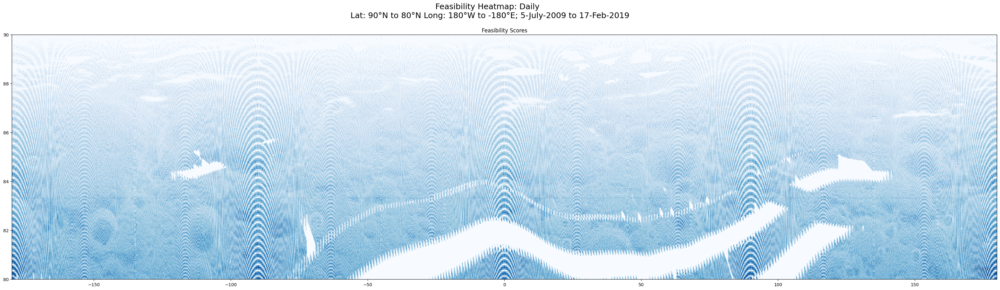

<Figure size 640x480 with 0 Axes>

In [ ]:
# Heat Map Visualization

fig, axs = plt.subplots(figsize=(40, 10))

X = lunar_temp_data_analysed['        clon']
Y = lunar_temp_data_analysed['       clat']

w = lunar_temp_data_analysed['feasibility_score']

axs.hist2d(X, Y, bins=heat_map_bins, cmap='Blues', weights=w)
axs.set_title(f'Feasibility Scores')

#plt.colorbar()
fig.suptitle(f'Feasibility Heatmap: Daily \n Lat: 90°N to 80°N Long: 180°W to -180°E; 5-July-2009 to 17-Feb-2019', fontsize=18, ha='center')
            
plt.show()
plt.savefig('../results/Lunar_Feasibility_Heatmap_t=daily.png')

In [ ]:
#data compression -> reducing computiational complexity

lunar_temp_data_analysed.to_hdf('../data/lunar_temp_data_analysed_compressed', key='data', mode='w', complevel=9, complib='blosc')
lunar_temp_data_analysed = pd.read_hdf('../data/lunar_temp_data_analysed_compressed', key='data')

In [ ]:
#Create Visualization with topographic map of the moon surface

fig, axs = plt.subplots(1, 3, figsize=(80, 20))

# Read the lunar topography image using Pillow
lunar_north_pole_img_original = Image.open('../data/6304h.tiff')

#convert lunar image into numpy array and get it into the right color format for further processing the image with libaries such as OpenCV
lunar_img_np = np.array(lunar_north_pole_img_original)
lunar_north_pole_img = cv2.cvtColor(lunar_img_np, cv2.COLOR_RGB2BGR)

#convert lunar north pole image into greyscale format to have a baseline map for choropleth map
lunar_north_pole_img_grey = cv2.cvtColor(lunar_north_pole_img, cv2.COLOR_RGB2GRAY)

#splitting the lunar_north_pole_image binarily into tha part with the black background and the coloured part
#all pixel colour values under 1 (-> near black values) get the value 0, the others get the value 255
#based on the number assignements all pixels with the value 255 are selected to create a mask, which is the part of the picture containing the satellite map, excluding the near-black background
#_ stores the threshold value and is not required anymore
#mask stores the relevant pixel positions 
_, mask = cv2.threshold(lunar_north_pole_img_grey, 1, 255, cv2.THRESH_BINARY)

#Find the center and radius of the North Pole region
#1. Get identified contours of the picture (outer lines of identied forms)
contours, _ = cv2.findContours(mask, 
                               cv2.RETR_EXTERNAL, #Taking only the extreme outer contours, because contour hierarchies are not relevant in this case
                               cv2.CHAIN_APPROX_SIMPLE #Removes redundant point and compreses data complexity
                               )

#2. Determine the maximum area enclosed by the contour using the max-function
contour_area = max( #determines the maximum elememnt in an iterable 
                   contours, #iterable = list of contours
                   key=cv2.contourArea #key to choose largest elements: cv2.contourArea which determines the area size enclosed by a contour
                   )

#3. Determine the minimum circle that encloses the contour_area and get center + radius
(x, y), radius = cv2.minEnclosingCircle(contour_area)


lunar_temp_data_analysed

#Normalization: The data must be normalized on a scale of 0-1 so that it can later be used to create a colormap
#1. Normalization Approach: min-max-normalization
#normalized_temps = (lunar_temp_data_analysed_iteration['       tbol',  operation] - np.min(lunar_temp_data_analysed_iteration['       tbol',  operation])) / (np.max(lunar_temp_data_analysed_iteration['       tbol',  operation]) - np.min(lunar_temp_data_analysed_iteration['       tbol',  operation]))

#2. Normalization Approach: percentile normalization (Better choice because more resistent to outliers)
p1 = np.percentile(lunar_temp_data_analysed_iteration['feasibility_score'], 1)
p99 = np.percentile(lunar_temp_data_analysed_iteration['feasibility_score'], 99)
normalized_temps = (lunar_temp_data_analysed_iteration['feasibility_score'] - p1) / (p99 - p1)

lunar_temp_data_analysed_iteration['feasibility_score'] = normalized_temps.copy()    

#Bring data into a coordinate-grid
temperature_grid = lunar_temp_data_analysed_iteration.pivot(index='       clat', columns='        clon', values=('feasibility_score'))
temperature_grid = temperature_grid.fillna(normalized_temps.mean()).copy()

#Polar coordinates (clats, clons) of the temperature data
clats, clons = np.mgrid[80:90:(temperature_grid.shape[0] * 1j), -180:180:(temperature_grid.shape[1] * 1j)]

#Convert the polar coordinates to Cartesian coordinates 
radius_scaled = radius * (clats - 80) / 10 #calculated the scaled_radius by dividing the actual clat delta by the max clat delta
cart_x = radius_scaled * np.cos(np.radians(clons)) + x #radians(clons) converts degrees to radians, by multyplining the radius_scaled by the cos of that radiant the x values can be determined 
                                                           #Imagine triangles in Cartesian coordinate system (one edge along the x-axis, one between the center and the pixel,...)
                                                           #The + x helps to set the centre to the centre of the lunar image 
cart_y = radius_scaled * np.sin(np.radians(clons)) + y # "

coords = np.array([cart_x.ravel(), cart_y.ravel()]).T #coordinates are each flattend into 1D arrays, mapped by their index and transposed to get in the right format

    #Data Interpolation to create a dataframe of the same size as the lunar image that contains the brightness values
temperature_data_mapped = griddata( #griddata performs interpolation - estimating a value based on a set of known data points to, in this case, reduce the amount of data points
                                        coords, #coordinates of input data points
                                        temperature_grid.to_numpy().ravel(), #values of input data points
                                        (np.indices(lunar_north_pole_img.shape[:2])[1], np.indices(lunar_north_pole_img.shape[:2])[0]), #coordinates of the points where to interpolate -> using the pixels of the lunar image (:2, because cholor channels in 3rd index are not to be considered)
                                        method='cubic' #as a more complex interpolation method (alt: linear, nearest)
                                        )
    
    #Potential C-Maps
colors = ['PiYG', 'PRGn', 'BrBG', 'PuOr', 'RdGy', 'RdBu', 'RdYlBu', 'RdYlGn', 'Spectral', 'coolwarm', 'bwr', 'seismic',
            'viridis', 'plasma', 'inferno', 'magma', 'cividis',
            'Greys', 'Purples', 'Blues', 'Greens', 'Oranges', 'Reds', 'YlOrBr', 'YlOrRd', 'OrRd', 'PuRd', 'RdPu', 'BuPu', 'GnBu', 'PuBu', 'YlGnBu', 'PuBuGn', 'BuGn', 'YlGn',
            'binary', 'gist_yarg', 'gist_gray', 'gray', 'bone', 'pink', 'spring', 'summer', 'autumn', 'winter', 'cool', 'Wistia', 'hot', 'afmhot', 'gist_heat', 'copper',
            'twilight', 'twilight_shifted', 'hsv',
            'flag', 'prism', 'ocean', 'gist_earth', 'terrain', 'gist_stern', 'gnuplot', 'gnuplot2', 'CMRmap', 'cubehelix', 'brg', 'gist_rainbow', 'rainbow', 'jet', 'turbo', 'nipy_spectral', 'gist_ncar']

    #Color the North Pole region based on the mapped temperature data
for color in colors:
    color = 'rainbow'
    colormap = plt.get_cmap(f'{color}') #{color}')
        #colormap = sns.color_palette("viridis", as_cmap=True)
        #colormap = sns.color_palette("Spectral", as_cmap=True)
        #colormap = sns.color_palette("coolwarm", as_cmap=True)
        #colormap = sns.cubehelix_palette(start=0, rot=2, dark=0, light=1, as_cmap=True)

    colored_temps = colormap(temperature_data_mapped)

        #Apply the mask to only color the region of interest
    colored_roi = (colored_temps[:, :, :3] * 255 * (mask[:, :, np.newaxis] / 255)).astype(np.uint8) #the mask-normalization serves the purpose of turning the mask values (0&255) into 0 & 1s -> Multiplying this with the colored_temps "delets" all colors out of the region of interest
    colored_image = cv2.addWeighted(lunar_north_pole_img, 0.4, colored_roi, 0.6, 0) #laying the lunar image and the colors of the region of interests on top of each other 

        #Save the final image
    final_image = cv2.cvtColor(colored_image, cv2.COLOR_BGR2RGB)
    current_image = Image.fromarray(final_image)
    current_image.save(f'../results/Lunar_Feasibility_Choropleth_c={color}_t=daily.tiff')

axs.imshow(current_image)
axs.set_title(f'Feasibility Score')
    
p1 = np.percentile(lunar_temp_data_analysed['feasibility_score'], 1)
p99 = np.percentile(lunar_temp_data_analysed['feasibility_score'], 99)

#Create the Normalize object using the min and max percentiles
vmin = p1
vmax = p99
norm = Normalize(vmin=vmin, vmax=vmax)

#Create the ScalarMappable object
sm = ScalarMappable(cmap=colormap, norm=norm)

# Add a colorbar to the plot using the ScalarMappable object
fig.colorbar(sm, orientation='vertical', label='Temp')

fig.suptitle(f'Lunar Feasibility Score Choropleth: Daily \n Lat: 90°N to 80°N Long: 180°W to -180°E; 5-July-2009 to 17-Feb-2019', fontsize=38, ha='center')

plt.savefig('../results/Lunar_Feasibility_Choropleth_t=daily.png')

plt.show()

/var/folders/1m/_421zvqd2kj8wnbn64qd_w4m0000gn/T/ipykernel_2886/4145045824.py:55: PerformanceWarning: The following operation may generate 3551420048 cells in the resulting pandas object.
  temperature_grid = lunar_temp_data_analysed_iteration.pivot(index='       clat', columns='        clon', values=('       tbol', operation))


: 

: 

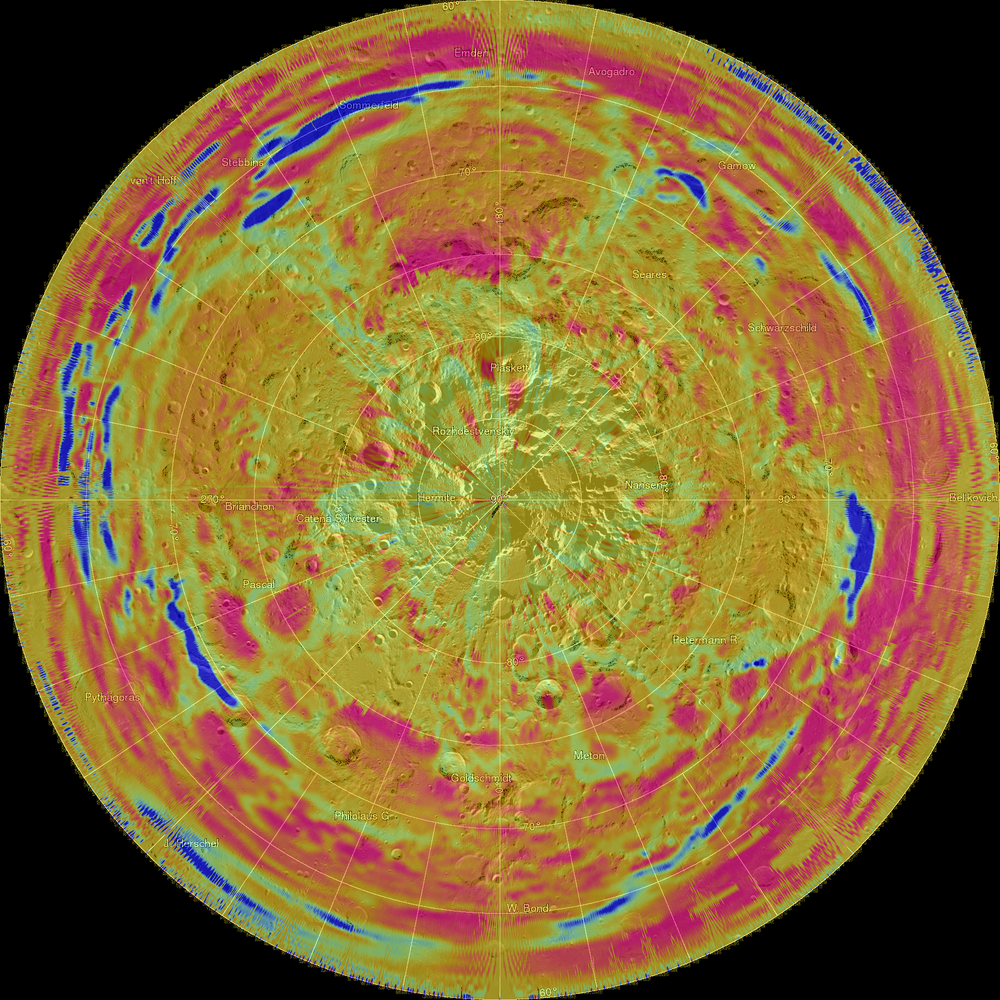

In [ ]:
current_image

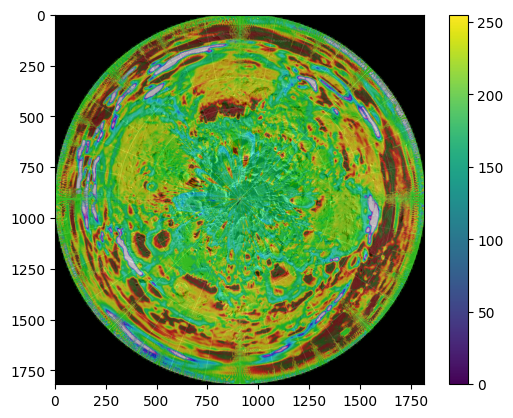

In [ ]:
fig, ax = plt.subplots()
plt.imshow(current_image)
plt.colorbar()
plt.show()

## 4h Local Time Intervals

1. Interval: 0-4 am
2. Interval: 4-8 am
3. Interval: 8 am - 12 pm
4. Interval: 12 - 4 pm
5. Interval: 4 - 8 pm
6. Interval: 8 - 12 pm

In [ ]:
#set parameters for analysis & visualization
coordinate_decimals = 1
heat_map_bins = 50

#### Analysis

In [ ]:
#Perform data analyis on an hourly basis

lunar_data_time_intervals = []

#Calculating min, max and average values for the following time intervals:

for i in range(0, 96, 12):

    current_time_interval = pd.concat(lunar_temp_data_collection[i:i+11])
    current_time_interval = current_time_interval.copy().groupby(['        clon', '       clat']).agg({'       tbol': ['min', 'max', 'mean']}).reset_index()

    lunar_data_time_intervals.append(current_time_interval)

ValueError: No objects to concatenate

#### Visualization

In [ ]:
# Create a figure with three subplots
fig, axs = plt.subplots(6, 3, figsize=(60, 80))

for interval in lunar_data_time_intervals:
        
    X = lunar_data_time_intervals[interval]['        clon']
    Y = lunar_data_time_intervals[interval]['       clat']

    for operation, subiteration in ['min', 'max', 'mean']:
        
        w = lunar_data_time_intervals[interval]['       tbol',  operation]

        axs[iteration, subiteration].hist2d(X, Y, bins=50, cmap='Blues', weights=w)
        axs[iteration, subiteration].set_title(f'Heat map: {operation}')

plt.show()

In [ ]:
lunar_temp_data_analysed = lunar_temp_data_analysed[[('        clon',     ''),( '       clat',     ''),( '       tbol', 'mean')]]

In [ ]:
lunar_temp_data_analysed

,clon,clat,tbol
,,,mean
0,-180.0,80.0,62.662030
1,-180.0,80.1,57.030230
2,-180.0,80.2,55.861032
3,-180.0,80.3,61.831653
4,-180.0,80.4,61.054167
...,...,...,...
348273,180.0,89.6,55.491524
348274,180.0,89.7,65.053914
348275,180.0,89.8,84.995230


In [ ]:
# Read the TIFF image using Pillow
#lunar_image_pil = Image.open('../data/lroc_color_poles_16k.tiff')
lunar_image_pil = Image.open('../data/lroc_color_poles_1k.jpeg')

# Convert the PIL Image to a numpy array
lunar_image_np = np.array(lunar_image_pil)

# Convert the image from RGB to BGR format
lunar_image = cv2.cvtColor(lunar_image_np, cv2.COLOR_RGB2BGR)

# Convert the lunar image to grayscale
lunar_gray = cv2.cvtColor(lunar_image, cv2.COLOR_BGR2GRAY)

lunar_gray_alpha = np.repeat(lunar_gray[..., np.newaxis], 4, axis=2)
lunar_gray_alpha[..., 3] = 255  # Set alpha channel to opaque

# Normalize the temperature data
normalized_temps = (lunar_temp_data_analysed['       tbol',  'mean'] - np.min(lunar_temp_data_analysed['       tbol',  'mean'])) / (np.max(lunar_temp_data_analysed['       tbol',  'mean']) - np.min(lunar_temp_data_analysed['       tbol',  'mean']))

lunar_temp_data_analysed['       tbol', 'mean'] = normalized_temps.copy()

temperature_grid = lunar_temp_data_analysed.pivot(index='       clat', columns='        clon', values=('       tbol', 'mean'))
temperature_grid = temperature_grid.fillna(normalized_temps.mean()).copy()

further_coordinates = np.arange(79.9, -90.1, -0.1)
further_coordinate_df = pd.DataFrame(index=further_coordinates)

# concatenate the new DataFrame with the original DataFrame
temperature_grid = pd.concat([further_coordinate_df, temperature_grid], axis=0)

temperature_grid = temperature_grid.sort_index(ascending=False).copy()
temperature_grid = temperature_grid.fillna(0).copy()

# Resize the temperature data to match the lunar_gray dimensions
resize_ratio_y = lunar_gray.shape[0] / temperature_grid.shape[0]
resize_ratio_x = lunar_gray.shape[1] / temperature_grid.shape[1]

resized_temps = zoom(temperature_grid, (resize_ratio_y, resize_ratio_x))

# Create a blank RGBA image with the same dimensions as the lunar image
color_map_image = np.zeros((lunar_gray.shape[0], lunar_gray.shape[1], 4), dtype=float)


# Map temperature values to RGBA colors using a color map
cmap = matplotlib.cm.get_cmap('Reds')
for i in range(resized_temps.shape[0]):

    print(f'{i}/{resized_temps.shape[0]}')

    for j in range(resized_temps.shape[1]):

        color_map_image[i, j] = cmap(resized_temps[i, j])

# Blend the grayscale lunar image and color map image
blended_image = cv2.addWeighted(lunar_gray_alpha.astype(float), 0.7, color_map_image[..., :4] * 255, 0.3, 0)


# Convert the blended_image from OpenCV (BGR) format to PIL (RGB) format
blended_image_rgb = cv2.cvtColor(blended_image.astype(np.uint8), cv2.COLOR_BGR2RGB)


# Create a PIL Image object from the numpy array
blended_image_pil = Image.fromarray(blended_image_rgb)

# Save the image as a TIFF file
blended_image_pil.save('../data/lroc_color_poles_16k_new.tiff')


/var/folders/1m/_421zvqd2kj8wnbn64qd_w4m0000gn/T/ipykernel_7526/2631278547.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  grouped_df['       tbol', 'mean'] = normalized_temps.copy()


0/512
1/512
2/512
3/512
4/512
5/512
6/512
7/512
8/512
9/512
10/512
11/512
12/512
13/512
14/512
15/512
16/512
17/512
18/512
19/512
20/512
21/512
22/512
23/512
24/512
25/512
26/512
27/512
28/512
29/512
30/512
31/512
32/512
33/512
34/512
35/512
36/512
37/512
38/512
39/512
40/512
41/512
42/512
43/512
44/512
45/512
46/512
47/512
48/512
49/512
50/512
51/512
52/512
53/512
54/512
55/512
56/512
57/512
58/512
59/512
60/512
61/512
62/512
63/512
64/512
65/512
66/512
67/512
68/512
69/512
70/512
71/512
72/512
73/512
74/512
75/512
76/512
77/512
78/512
79/512
80/512
81/512
82/512
83/512
84/512
85/512
86/512
87/512
88/512
89/512
90/512
91/512
92/512
93/512
94/512
95/512
96/512
97/512
98/512
99/512
100/512
101/512
102/512
103/512
104/512
105/512
106/512
107/512
108/512
109/512
110/512
111/512
112/512
113/512
114/512
115/512
116/512
117/512
118/512
119/512
120/512
121/512
122/512
123/512
124/512
125/512
126/512
127/512
128/512
129/512
130/512
131/512
132/512
133/512
134/512
135/512
136/512
137/512
138/51

In [ ]:
import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.cm
from scipy.ndimage import zoom
from scipy.interpolate import griddata
from PIL import Image

# Read the lunar image using Pillow
lunar_north_pole_img_original = Image.open('../data/6304h.tiff')

#convert lunar image into numpy array and get it into the right color format for further processing the image with libaries such as OpenCV
lunar_image_np = np.array(lunar_north_pole_img_original)
lunar_north_pole_img = cv2.cvtColor(lunar_image_np, cv2.COLOR_RGB2BGR)

# Create a mask for the North Pole region
gray_img = cv2.cvtColor(lunar_image, cv2.COLOR_RGB2GRAY)

# Create a mask for the North Pole region
_, mask = cv2.threshold(gray_img, 1, 255, cv2.THRESH_BINARY)

# Find the center and radius of the North Pole region
contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
cnt = max(contours, key=cv2.contourArea)
(x, y), radius = cv2.minEnclosingCircle(cnt)

# Assuming the temperature data is in a DataFrame called lunar_temp_data_analysed
normalized_temps = (lunar_temp_data_analysed['       tbol',  'mean'] - np.min(lunar_temp_data_analysed['       tbol',  'mean'])) / (np.max(lunar_temp_data_analysed['       tbol',  'mean']) - np.min(lunar_temp_data_analysed['       tbol',  'mean']))
lunar_temp_data_analysed['       tbol', 'mean'] = normalized_temps.copy()

temperature_grid = lunar_temp_data_analysed.pivot(index='       clat', columns='        clon', values=('       tbol', 'mean'))
temperature_grid = temperature_grid.fillna(normalized_temps.mean()).copy()

# Polar coordinates (clats, clons) of the temperature data
clats, clons = np.mgrid[80:90:(temperature_grid.shape[0] * 1j), -180:180:(temperature_grid.shape[1] * 1j)]

# Convert the polar coordinates to Cartesian coordinates
radius_scaled = radius * (clats - 80) / 10  # Scale the radius according to the clat values
cart_x = radius_scaled * np.cos(np.radians(clons)) + x
cart_y = radius_scaled * np.sin(np.radians(clons)) + y

# Map the temperature data to the North Pole region using interpolation
coords = np.array([cart_x.ravel(), cart_y.ravel()]).T
temperature_data_mapped = griddata(coords, temperature_grid.to_numpy().ravel(), (np.indices(lunar_image.shape[:2])[1], np.indices(lunar_image.shape[:2])[0]), method='cubic')

# Color the North Pole region based on the mapped temperature data
colormap = plt.get_cmap('seismic')
normalized_temps = (temperature_data_mapped - np.nanmin(temperature_data_mapped)) / (np.nanmax(temperature_data_mapped) - np.nanmin(temperature_data_mapped))
colored_temps = colormap(normalized_temps)

# Apply the mask to only color the region of interest
colored_roi = (colored_temps[..., :3] * 255 * (mask[:, :, np.newaxis] / 255)).astype(np.uint8)
colored_image = cv2.addWeighted(lunar_image, 0.9, colored_roi, 0.3, 0)

# Save the final image
final_image = cv2.cvtColor(colored_image, cv2.COLOR_BGR2RGB)
Image.fromarray(final_image).save('../data/analysis_seismic.tiff')
current_image = Image.fromarray(final_image)


In [ ]:
# Read the lunar image using Pillow
lunar_north_pole_img_original = Image.open('../data/6304h.tiff')

#convert lunar image into numpy array and get it into the right color format for further processing the image with libaries such as OpenCV
lunar_img_np = np.array(lunar_north_pole_img_original)
lunar_north_pole_img = cv2.cvtColor(lunar_img_np, cv2.COLOR_RGB2BGR)

#convert lunar north pole image into greyscale format to have a baseline map for choropleth map
lunar_north_pole_img_grey = cv2.cvtColor(lunar_north_pole_img, cv2.COLOR_RGB2GRAY)

#splitting the lunar_north_pole_image binarily into tha part with the black background and the coloured part
#all pixel colour values under 1 (-> black values) get the value -1, the others get the value 255
lunar_north_pole_img_grey = lunar_north_pole_img_grey.astype(np.uint8)
_, mask = cv2.threshold(lunar_north_pole_img_grey, 1, 255, cv2.THRESH_BINARY)

# Find the center and radius of the North Pole region
contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
cnt = max(contours, key=cv2.contourArea)
(x, y), radius = cv2.minEnclosingCircle(cnt)

# Assuming the temperature data is in a DataFrame called lunar_temp_data_analysed
normalized_temps = (lunar_temp_data_analysed['       tbol',  'mean'] - np.min(lunar_temp_data_analysed['       tbol',  'mean'])) / (np.max(lunar_temp_data_analysed['       tbol',  'mean']) - np.min(lunar_temp_data_analysed['       tbol',  'mean']))
lunar_temp_data_analysed['       tbol', 'mean'] = normalized_temps.copy()

temperature_grid = lunar_temp_data_analysed.pivot(index='       clat', columns='        clon', values=('       tbol', 'mean'))
temperature_grid = temperature_grid.fillna(normalized_temps.mean()).copy()

# Polar coordinates (clats, clons) of the temperature data
clats, clons = np.mgrid[80:90:(temperature_grid.shape[0] * 1j), -180:180:(temperature_grid.shape[1] * 1j)]

# Convert the polar coordinates to Cartesian coordinates
radius_scaled = radius * (clats - 80) / 10  # Scale the radius according to the clat values
cart_x = radius_scaled * np.cos(np.radians(clons)) + x
cart_y = radius_scaled * np.sin(np.radians(clons)) + y

# Map the temperature data to the North Pole region using interpolation
coords = np.array([cart_x.ravel(), cart_y.ravel()]).T
temperature_data_mapped = griddata(coords, temperature_grid.to_numpy().ravel(), (np.indices(lunar_north_pole_img.shape[:2])[1], np.indices(lunar_north_pole_img.shape[:2])[0]), method='cubic')

# Color the North Pole region based on the mapped temperature data
colors = ['PiYG', 'PRGn', 'BrBG', 'PuOr', 'RdGy', 'RdBu', 'RdYlBu', 'RdYlGn', 'Spectral', 'coolwarm', 'bwr', 'seismic',
          'viridis', 'plasma', 'inferno', 'magma', 'cividis',
          'Greys', 'Purples', 'Blues', 'Greens', 'Oranges', 'Reds', 'YlOrBr', 'YlOrRd', 'OrRd', 'PuRd', 'RdPu', 'BuPu', 'GnBu', 'PuBu', 'YlGnBu', 'PuBuGn', 'BuGn', 'YlGn',
          'binary', 'gist_yarg', 'gist_gray', 'gray', 'bone', 'pink', 'spring', 'summer', 'autumn', 'winter', 'cool', 'Wistia', 'hot', 'afmhot', 'gist_heat', 'copper',
          'twilight', 'twilight_shifted', 'hsv',
          'flag', 'prism', 'ocean', 'gist_earth', 'terrain', 'gist_stern', 'gnuplot', 'gnuplot2', 'CMRmap', 'cubehelix', 'brg', 'gist_rainbow', 'rainbow', 'jet', 'turbo', 'nipy_spectral', 'gist_ncar']

for color in colors:
    colormap = plt.get_cmap(f'{color}')
    normalized_temps = (temperature_data_mapped - np.nanmin(temperature_data_mapped)) / (np.nanmax(temperature_data_mapped) - np.nanmin(temperature_data_mapped))
    colored_temps = colormap(normalized_temps)

    # Apply the mask to only color the region of interest
    colored_roi = (colored_temps[..., :3] * 255 * (mask[:, :, np.newaxis] / 255)).astype(np.uint8)
    colored_image = cv2.addWeighted(lunar_north_pole_img, 0.4, colored_roi, 0.6, 0)

    # Save the final image
    final_image = cv2.cvtColor(colored_image, cv2.COLOR_BGR2RGB)
    current_image = Image.fromarray(final_image)
    current_image.save(f'../data/analysis_{color}.tiff')
    current_image
